# LMDZOR-STD-SL12 (no snow)

conda env: new `phd_v3` (in `envs/phd`)

See more: https://github.com/mickaellalande/PhD/blob/master/Jean-Zay/SCA_parameterization/LMDZOR-STD/LMDZOR-STD-SL12.ipynb

Experience LMDZOR-STD-SL12 bug no snow

## LMDZOR-STD-REF

```fortran
! LMDZOR-STD-REF
frac_snow_veg(:) = tanh(snowdepth(:)/(0.025*(snowrho_ave(:)/50.)))
```
https://github.com/mickaellalande/PhD/blob/master/local/SCE_SWE_parametization/Niu2007.ipynb

- Jean-Zay WORK: `/gpfsdswork/projects/rech/goe/ufz23bm/SCA_parameterization/modipsl/config/LMDZOR_v6/LMDZOR-STD-REF`
- Jean-Zay STORE: `/gpfsstore/rech/goe/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF`
- THREDDS: `/gpfsdsmnt/ipsl/dods/pub/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/`
- CICLAD: `/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/` 
- https://vesg.ipsl.upmc.fr/thredds/catalog/idris_work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/catalog.html


## LMDZOR-STD-SL12

https://github.com/mickaellalande/PhD/blob/master/local/SCE_SWE_parametization/EASE-Grid_SCF-SWE_NH_params.ipynb

- Jean-Zay WORK: `/gpfswork/rech/goe/ufz23bm/SCA_parameterization/modipsl/config/LMDZOR_v6/LMDZOR-STD-SL12`
- Jean-Zay STORE: `/gpfsscratch/rech/goe/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12`
- THREDDS: `/gpfsdsmnt/ipsl/dods/pub/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/`
- CICLAD: `/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/` 
- https://vesg.ipsl.upmc.fr/thredds/catalog/idris_work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/catalog.html

## Import modules

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


In [2]:
xr.__version__

'0.16.0'

## Define paths

In [3]:
root = '/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/'
exp_ref = 'LMDZOR-STD-REF'
exp_new = 'LMDZOR-STD-SL12'

In [4]:
# !ls /thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/

## Make function to get data

In [133]:
def get_data(list_vars, period, season, zone):
    """
        Get reference and new experiments + observations.

        Parameters
        ----------
        list_vars : list
            List of variables. Options are: 'frac_snow', 't2m', 'precip', 'ta'
        period : slice
            Period
        season : str
            Season (ex: 'annual', 'DJF', '1')
        zone : str
            Zone of study (ex: 'HMA', 'GLOB', 'NH')

        Returns
        -------
        ref, new, obs : list of Dataset
            List of reference and new experiments + observations regrided on model dataset (not 
            loaded) for each variable.
            
        clim_ref, clim_new, clim_obs : list of DataArray
            List of reference and new experiments + observations regrided on model climatologies
            for each variable.

        Example
        -------
        >>>  list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
                ['frac_snow', 't2m', 'precip'], slice('1981','1989'), 'annual', 'GLOB'
            )

    """
    
    list_ref = []
    list_new = []
    list_clim_ref = []
    list_clim_new = []
       
    list_var_SRF = ['frac_snow']
    list_var_ATM = ['t2m', 'precip', 'ta', 'snow']
    latlim, lonlim = u.get_zone(zone)

    for var in list_vars:

        print(
            f"""
    #############
    ### Variable: {var} 
    #############
            """
        )

        if var in list_var_SRF:
            component = 'SRF'
        elif var in list_var_ATM:
            component = 'ATM'
        else:
            raise ValueError(f"Invalid var argument: '{var}'. Valid names are: 'frac_snow'.")

        path = root+exp_ref+'/'+component+'/Analyse/TS_MO/'+exp_ref+'_19800101_19891230_1M_'+var+'.nc'
        print('Open reference simulation:\n'+path+'\n')
        ref = xr.open_dataset(path)[var]
        ref.attrs['title'] = exp_ref

        path = root+exp_new+'/'+component+'/Analyse/TS_MO/'+exp_new+'_19800101_19891230_1M_'+var+'.nc'
        print('Open new simulation:\n'+path+'\n')
        new = xr.open_dataset(path)[var]
        new.attrs['title'] = exp_new

        # Rename time dimension and sort latitude from -90 to 90
        ref = ref.rename({'time_counter': 'time'}).sortby('lat')
        new = new.rename({'time_counter': 'time'}).sortby('lat')

        # Compute climatolgy
        clim_ref = u.clim(
            ref.sel(time=period, lat=latlim, lon=lonlim), season=season, calendar='360_day')
        clim_ref.attrs['season'] = season
        clim_ref.attrs['zone'] = zone

        clim_new = u.clim(
            new.sel(time=period, lat=latlim, lon=lonlim), season=season, calendar='360_day')
        clim_new.attrs['season'] = season
        clim_new.attrs['zone'] = zone

        # Unit conversion
        if var in ['tas', 'tmp', 't2m', 'ta']:
            with xr.set_options(keep_attrs=True):
                clim_ref -= 273.15
                clim_new -= 273.15
            clim_ref.attrs['units'] = '°C'
            clim_new.attrs['units'] = '°C'

            if var in ['ta']:
                clim_ref = clim_ref.assign_coords({'plev': clim_ref.plev/100}).rename({'plev': 'level'})
                clim_new = clim_new .assign_coords({'plev': clim_new.plev/100}).rename({'plev': 'level'})

        elif var in ['pr', 'precip', 'snow']:
            with xr.set_options(keep_attrs=True):
                clim_ref *= 86400
                clim_new *= 86400
            clim_ref.attrs['units'] = 'mm/day'
            clim_new.attrs['units'] = 'mm/day'
        
        list_ref.append(ref)
        list_new.append(new)
        list_clim_ref.append(clim_ref)
        list_clim_new.append(clim_new)
               
    return list_ref, list_new, list_clim_ref, list_clim_new

## Plot differences and compare to observation

### HMA

#### Get data

In [134]:
# list_vars = ['frac_snow']
list_vars = ['frac_snow', 't2m', 'precip', 'snow']

# Period for climatologies (removing first year spin-up)
period = slice('1981','1989')
season = 'annual'
zone = 'HMA'

list_ref, list_new, list_clim_ref, list_clim_new = get_data(
    list_vars, period, season, zone)


    #############
    ### Variable: frac_snow 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/SRF/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_frac_snow.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/SRF/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_frac_snow.nc


    #############
    ### Variable: t2m 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_t2m.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/ATM/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_t2m.nc


    #############
    ### Variable: precip 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_1980010

# Load obs

In [91]:
period_clim = slice('1979', '2008')

### APHRODITE http://aphrodite.st.hirosaki-u.ac.jp/download/data/search/  
http://aphrodite.st.hirosaki-u.ac.jp/download/
V1101 et V1101EX_R1 domain MA

In [92]:
obs_V1101 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101.*.nc', combine='by_coords'
).precip

obs_V1101_EXR1 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101_EXR1.*.nc', combine='by_coords'
).precip

obs_V1101 = obs_V1101.rename({'longitude': 'lon', 'latitude': 'lat'})
obs = xr.combine_nested([obs_V1101, obs_V1101_EXR1], concat_dim='time')

pr_obs = obs.resample(time='1MS').mean('time').sel(time=period_clim)

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


### Regrid using xESMF (https://xesmf.readthedocs.io/en/latest/) 

In [93]:
# For adding NaN values outside of the grid, otherwise it puts 0 (see issue just up #15)
import scipy
def add_matrix_NaNs(regridder):
    X = regridder.weights
    M = scipy.sparse.csr_matrix(X)
    num_nonzeros = np.diff(M.indptr)
    M[num_nonzeros == 0, 0] = np.NaN
    regridder.weights = scipy.sparse.coo_matrix(M)
    return regridder

# Make the regrider
regridder = xe.Regridder(pr_obs, list_ref[0], 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
print(regridder)

# Regrid the data
pr_obs_regrid = regridder(pr_obs)

Reuse existing file: bilinear_140x180_143x144.nc


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_140x180_143x144.nc 
Reuse pre-computed weights? True 
Input grid shape:           (140, 180) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      False


In [94]:
pr_obs_regrid_clim = pr_obs_regrid.mean('time')
pr_obs_regrid_clim.load()

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray 'precip' (lat: 143, lon: 144)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lon      (lon) float32 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0

## cru_ts4.04
https://crudata.uea.ac.uk/cru/data/hrg/  

In [100]:
ds = xr.open_dataset('/data/mlalande/CRU/tmp/cru_ts4.04.1901.2019.tmp.dat.nc') \
        .sel(time=period_clim)
tas_obs = ds.tmp

regridder_obs = xe.Regridder(tas_obs, list_ref[0], 'bilinear', periodic=True, reuse_weights=True)
tas_obs_regrid = regridder_obs(tas_obs)

Reuse existing file: bilinear_360x720_143x144_peri.nc


In [96]:
tas_obs_regrid_clim = tas_obs_regrid.mean('time')
tas_obs_regrid_clim.load()

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<xarray.DataArray 'tmp' (lat: 143, lon: 144)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lon      (lon) float32 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0

### ESA snow CCI AVHRR (linear interpolation 10 days maxgap)
https://github.com/mickaellalande/PhD/blob/master/local/ESA_CCI_snow/snowCCI_preprocess_AVHRR_gricad_v1.ipynb

Mois manquant en 1994/1995 mais ok ici, commence en 1982 (donc 1 an de moins mais ok ici)

In [83]:
root_data_path = '/data/mlalande/'
ds = xr.open_mfdataset(root_data_path+'ESA_CCI_SNOW/preprocess/scfg/AVHRR_MERGED/v2.0/monthly_1deg/*.nc').sel(time=period_clim)
# Check if the time steps are ok
# np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, ds.time.size)
# démarre en 1982

snow_cci_interp = ds['scfg_interp_1deg_icefilled']
snow_cci_interp = snow_cci_interp.reindex(time=pd.date_range('1982-01-31T00:00:00.000000000', '2008-12-31T00:00:00.000000000', freq='M')) # reindex to add dates from nov 1994 to jan 1995
snow_cci_interp.load()
snow_cci_interp.loc['1994-10'] = snow_cci_interp.loc['1994-11'].values

In [84]:
regridder = xe.Regridder(snow_cci_interp, list_ref[0], 'bilinear', periodic=True, reuse_weights=True)
snow_cci_interp_regrid = regridder(snow_cci_interp)

Reuse existing file: bilinear_180x360_143x144_peri.nc


In [85]:
snow_cci_interp_regrid_clim = snow_cci_interp_regrid.groupby('time.month').mean().mean('month')
snow_cci_interp_regrid_clim.load()

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<xarray.DataArray 'scfg_interp_1deg_icefilled' (lat: 143, lon: 144)>
array([[100., 100., 100., ..., 100., 100., 100.],
       [100., 100., 100., ..., 100., 100., 100.],
       [100., 100., 100., ..., 100., 100., 100.],
       ...,
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan]])
Coordinates:
  * lon      (lon) float32 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0

# Make plots

In [8]:
list_clim_new[0].attrs['title']

'LMDZOR-STD-SL12'

In [31]:
latlim, lonlim = u.get_zone('HMA')

## tas

In [33]:
latlim

slice(20, 50, None)

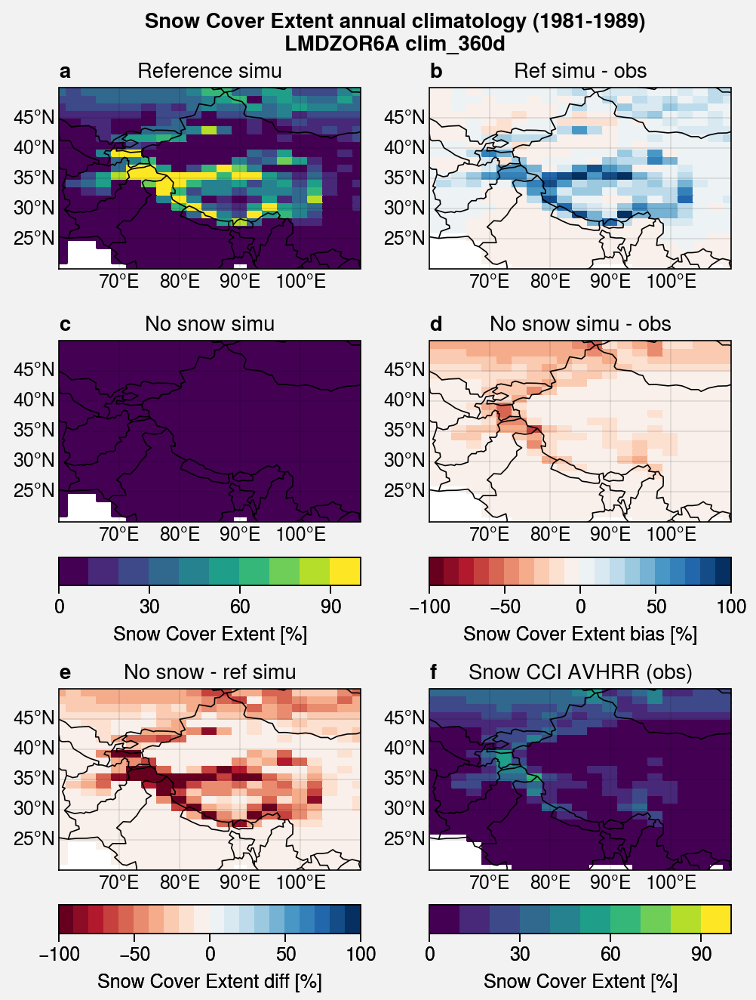

In [89]:
fig, axs = plot.subplots(ncols=2, nrows=3, proj='cyl', axwidth=2)

cmap = 'viridis'
cmap_bias = 'RdBu'
levels = plot.arange(0, 100, 10)
levels_bias = plot.arange(-100, 100, 10)


# Ref
axs[0].pcolormesh(list_clim_ref[0], cmap=cmap, levels=levels)
axs[0].format(title='Reference simu')

# Ref - obs
axs[1].pcolormesh(list_clim_ref[0] - snow_cci_interp_regrid_clim, cmap=cmap_bias, levels=levels_bias)
axs[1].format(title='Ref simu - obs')

# New
m1 = axs[2].pcolormesh(list_clim_new[0], cmap=cmap, levels=levels)
axs[2].format(title='No snow simu')

# New - obs
m4 = axs[3].pcolormesh(list_clim_new[0] - snow_cci_interp_regrid_clim, cmap=cmap_bias, levels=levels_bias)
axs[3].format(title='No snow simu - obs')

# New - ref
m2 = axs[4].pcolormesh(list_clim_new[0] - list_clim_ref[0], cmap=cmap_bias, levels=levels_bias)
axs[4].format(title='No snow - ref simu')
axs[4].colorbar(m2, label='Snow Cover Extent diff [%]', loc='b')


# Obs
axs[5].pcolormesh(snow_cci_interp_regrid_clim, cmap=cmap, levels=levels)
axs[5].format(title='Snow CCI AVHRR (obs)')
axs[5].colorbar(m1, label='Snow Cover Extent [%]', loc='b')

axs[2].colorbar(m1, label='Snow Cover Extent [%]', loc='b')
axs[3].colorbar(m4, label='Snow Cover Extent bias [%]', loc='b')

axs.format(
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    labels=True, abc=True, borders=True, coast=True,
    suptitle='Snow Cover Extent annual climatology (1981-1989)\nLMDZOR6A clim_360d'
)

fig.save('img/LMDZOR6A_clim_360d_nosnow_snc_HMA.jpg')

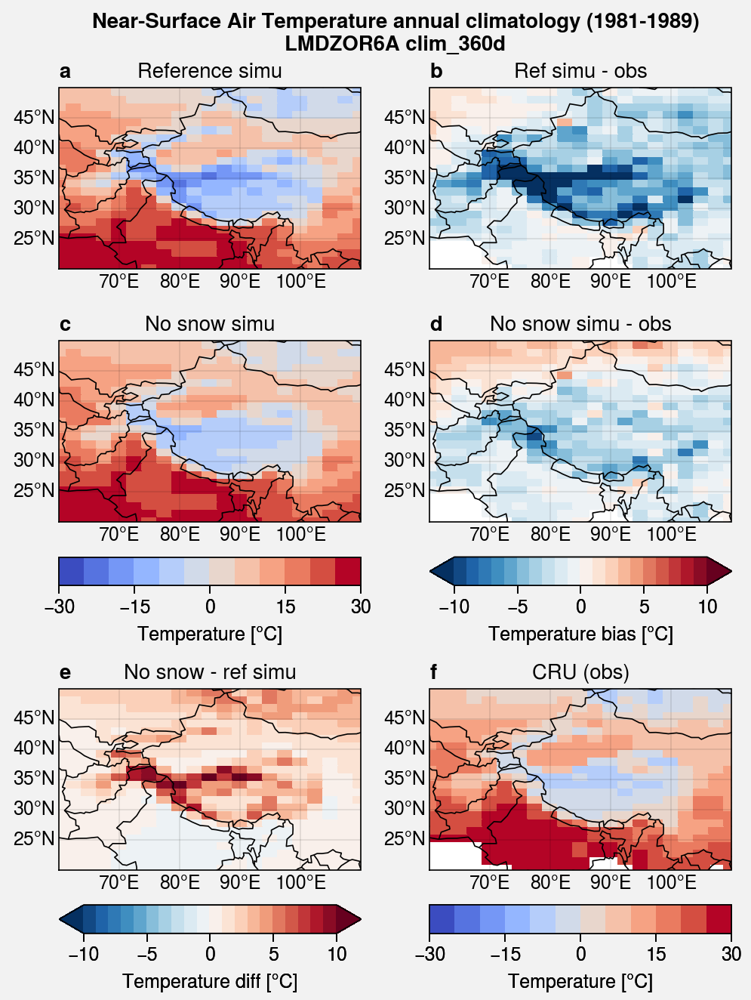

In [115]:
fig, axs = plot.subplots(ncols=2, nrows=3, proj='cyl', axwidth=2)

cmap = 'CoolWarm'
cmap_bias = 'RdBu_r'
levels = plot.arange(-30, 30, 5)
levels_bias = plot.arange(-10, 10, 1)


# Ref
axs[0].pcolormesh(list_clim_ref[1], cmap=cmap, levels=levels)
axs[0].format(title='Reference simu')

# Ref - obs
axs[1].pcolormesh(list_clim_ref[1] - tas_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[1].format(title='Ref simu - obs')

# New
m1 = axs[2].pcolormesh(list_clim_new[1], cmap=cmap, levels=levels)
axs[2].format(title='No snow simu')

# New - obs
m4 = axs[3].pcolormesh(list_clim_new[1] - tas_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[3].format(title='No snow simu - obs')

# New - ref
m2 = axs[4].pcolormesh(list_clim_new[1] - list_clim_ref[1], cmap=cmap_bias, levels=levels_bias, extend='both')
axs[4].format(title='No snow - ref simu')
axs[4].colorbar(m2, label='Temperature diff [°C]', loc='b')


# Obs
axs[5].pcolormesh(tas_obs_regrid_clim, cmap=cmap, levels=levels)
axs[5].format(title='CRU (obs)')
axs[5].colorbar(m1, label='Temperature [°C]', loc='b')

axs[2].colorbar(m1, label='Temperature [°C]', loc='b')
axs[3].colorbar(m4, label='Temperature bias [°C]', loc='b')

axs.format(
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    labels=True, abc=True, borders=True, coast=True,
    suptitle='Near-Surface Air Temperature annual climatology (1981-1989)\nLMDZOR6A clim_360d'
)

fig.save('img/LMDZOR6A_clim_360d_nosnow_tas_HMA.jpg')

In [120]:
list_clim_new[2]

<xarray.DataArray (lat: 24, lon: 21)>
array([[4.91090449e-02, 4.38004751e-02, 2.38281560e-01, 7.43590143e-01,
        1.35640746e+00, 3.14357996e+00, 4.36011376e+00, 4.59371101e+00,
        3.41015409e+00, 3.57741011e+00, 2.70850395e+00, 1.80672412e+00,
        2.11875838e+00, 4.72519829e+00, 6.38990906e+00, 4.70464263e+00,
        3.87582565e+00, 4.28107659e+00, 3.89810467e+00, 1.85472435e+00,
        2.33326553e+00],
       [5.36454125e-02, 4.24728025e-02, 7.18838215e-02, 4.30362798e-01,
        1.02997800e+00, 2.33469627e+00, 3.29157619e+00, 3.90283173e+00,
        3.00516242e+00, 2.77225799e+00, 3.44095595e+00, 1.86927947e+00,
        2.06363823e+00, 6.40219211e+00, 6.34305731e+00, 4.23459192e+00,
        3.96680652e+00, 3.59819716e+00, 3.49520763e+00, 3.38361972e+00,
        2.26705886e+00],
       [5.44378398e-02, 3.19328223e-02, 9.69957097e-02, 1.85999458e-01,
        5.00972100e-01, 1.54261544e+00, 2.37773888e+00, 2.68850609e+00,
        2.97429721e+00, 3.30143939e+00, 3.45579550e+00, 3.21166700e+00,
        4.46869311e+00, 5.79174465e+00, 6.18013729e+00, 4.22076995e+00,
        3.72643075e+00, 4.18933559e+00, 4.68394436e+00, 4.00542624e+00,
        4.74993744e+00],
       [1.21573829e-01, 8.07592817e-02, 9.92925624e-02, 7.68223129e-02,
        6.15145034e-01, 1.24974095e+00, 1.74227003e+00, 2.06917076e+00,
...
        6.12864501e-01, 6.92776167e-01, 5.90066477e-01, 6.66344397e-01,
        7.00365730e-01],
       [7.27207406e-01, 5.95061911e-01, 6.86345446e-01, 7.92273742e-01,
        8.00164239e-01, 7.05288718e-01, 5.35292053e-01, 5.35438249e-01,
        5.44664492e-01, 6.47922501e-01, 8.95414560e-01, 4.11172328e-01,
        5.59815635e-01, 9.89388786e-01, 4.56422762e-01, 8.40506856e-01,
        1.39537310e+00, 1.48060581e+00, 9.96631012e-01, 9.43540102e-01,
        9.86984481e-01],
       [9.16408736e-01, 8.36708072e-01, 9.03556733e-01, 1.03111455e+00,
        9.05973205e-01, 1.03180687e+00, 9.65768958e-01, 7.97517582e-01,
        8.96012996e-01, 6.55032735e-01, 9.64830224e-01, 1.30640430e+00,
        1.32707221e+00, 7.90647753e-01, 7.23120062e-01, 1.24935353e+00,
        1.63784708e+00, 1.25378663e+00, 1.01781083e+00, 1.51267980e+00,
        1.37263308e+00],
       [1.04034311e+00, 9.33500552e-01, 9.57500742e-01, 1.11828765e+00,
        1.05318654e+00, 1.15963292e+00, 1.25234509e+00, 1.02873927e+00,
        1.01861653e+00, 1.30951706e+00, 3.48671483e+00, 1.62293206e+00,
        1.84409990e+00, 1.17273132e+00, 1.35521494e+00, 1.43941314e+00,
        1.44091711e+00, 1.35861551e+00, 1.10391270e+00, 1.59922374e+00,
        1.95650703e+00]])
Coordinates:
  * lat      (lat) float32 20.28169 21.549295 22.816902 ... 48.169014 49.43662
  * lon      (lon) float32 60.0 62.5 65.0 67.5 70.0 ... 102.5 105.0 107.5 110.0
    season   <U6 'annual'
Attributes:
    long_name:           Precip Totale liq+sol
    units:               mm/day
    online_operation:    average
    interval_operation:  900 s
    interval_write:      1 month
    cell_methods:        time: mean (interval: 900 s)
    title:               LMDZOR-STD-SL12
    period:              1981-1989
    season:              annual
    zone:                HMA

In [121]:
pr_obs_regrid_clim

<xarray.DataArray 'precip' (lat: 143, lon: 144)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lon      (lon) float32 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0

In [119]:
list_clim_new[2] - pr_obs_regrid_clim

<xarray.DataArray (lat: 24, lon: 21)>
array([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
...
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan]])
Coordinates:
  * lat      (lat) float64 20.28 21.55 22.82 24.08 ... 45.63 46.9 48.17 49.44
  * lon      (lon) float64 60.0 62.5 65.0 67.5 70.0 ... 102.5 105.0 107.5 110.0
    season   <U6 'annual'

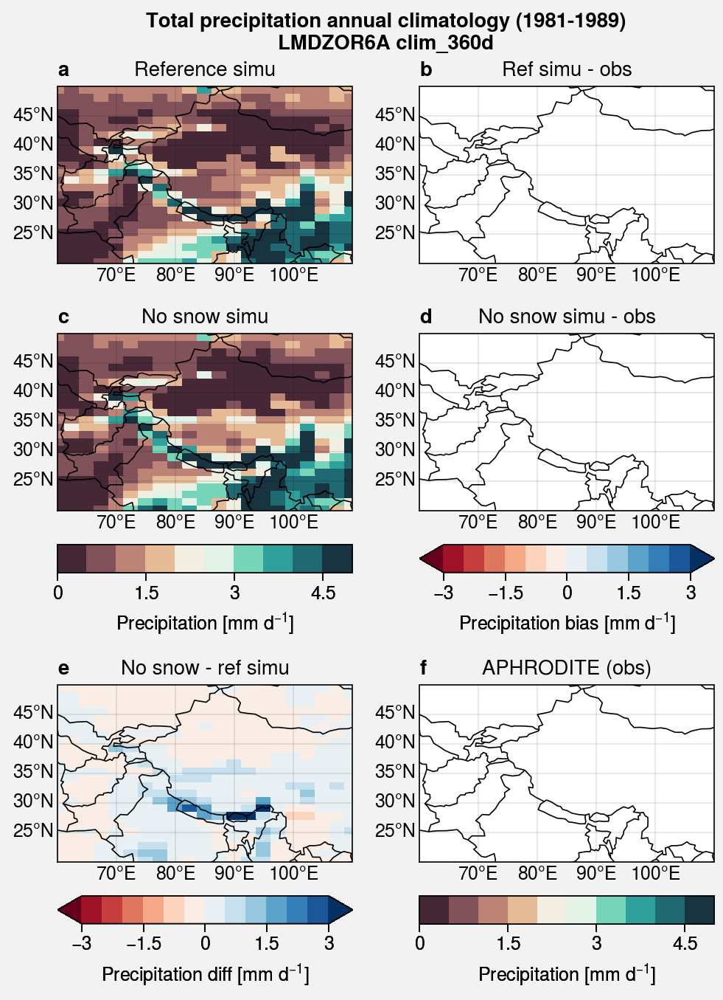

In [123]:
fig, axs = plot.subplots(ncols=2, nrows=3, proj='cyl', axwidth=2)

cmap = 'DryWet'
cmap_bias = 'RdBu'
levels = plot.arange(0, 5, 0.5)
levels_bias = plot.arange(-3, 3, 0.5)


# Ref
axs[0].pcolormesh(list_clim_ref[2], cmap=cmap, levels=levels)
axs[0].format(title='Reference simu')

# Ref - obs
axs[1].pcolormesh(list_clim_ref[2] - pr_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[1].format(title='Ref simu - obs')

# New
m1 = axs[2].pcolormesh(list_clim_new[2], cmap=cmap, levels=levels)
axs[2].format(title='No snow simu')

# New - obs
m4 = axs[3].pcolormesh(list_clim_new[2] - pr_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[3].format(title='No snow simu - obs')

# New - ref
m2 = axs[4].pcolormesh(list_clim_new[2] - list_clim_ref[2], cmap=cmap_bias, levels=levels_bias, extend='both')
axs[4].format(title='No snow - ref simu')
axs[4].colorbar(m2, label='Precipitation diff [mm d$^{-1}$]', loc='b')


# Obs
axs[5].pcolormesh(pr_obs_regrid_clim, cmap=cmap, levels=levels)
axs[5].format(title='APHRODITE (obs)')
axs[5].colorbar(m1, label='Precipitation [mm d$^{-1}$]', loc='b')

axs[2].colorbar(m1, label='Precipitation [mm d$^{-1}$]', loc='b')
axs[3].colorbar(m4, label='Precipitation bias [mm d$^{-1}$]', loc='b')

axs.format(
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    labels=True, abc=True, borders=True, coast=True,
    suptitle='Total precipitation annual climatology (1981-1989)\nLMDZOR6A clim_360d'
)

# fig.save('img/LMDZOR6A_clim_360d_nosnow_tas_HMA.jpg')

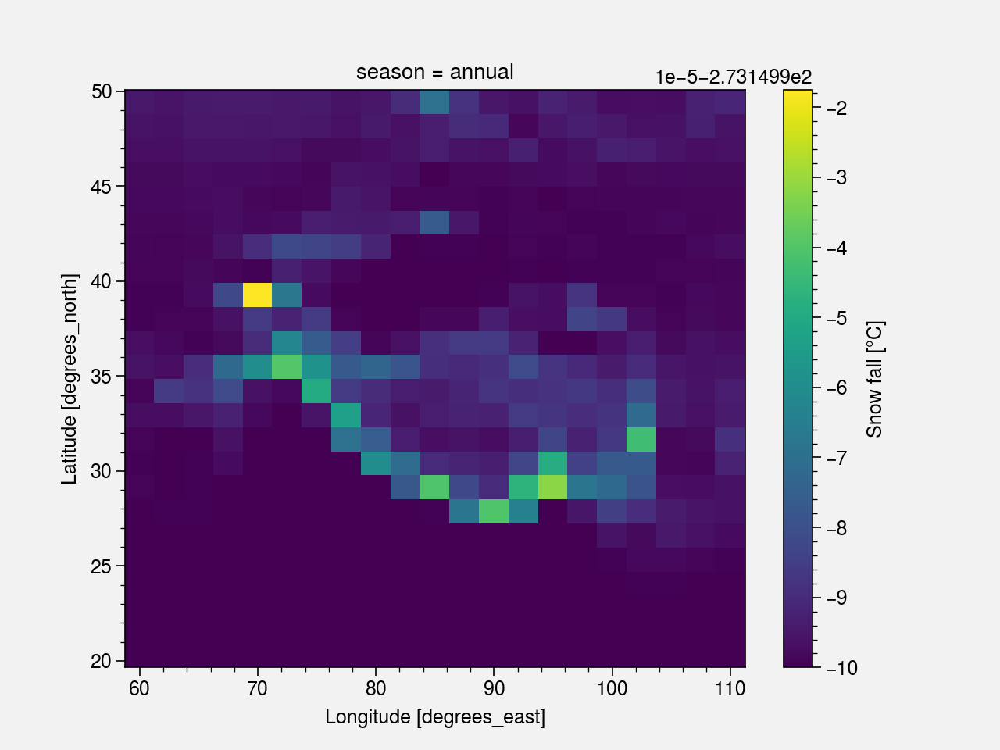

In [132]:
list_clim_ref[3].plot()

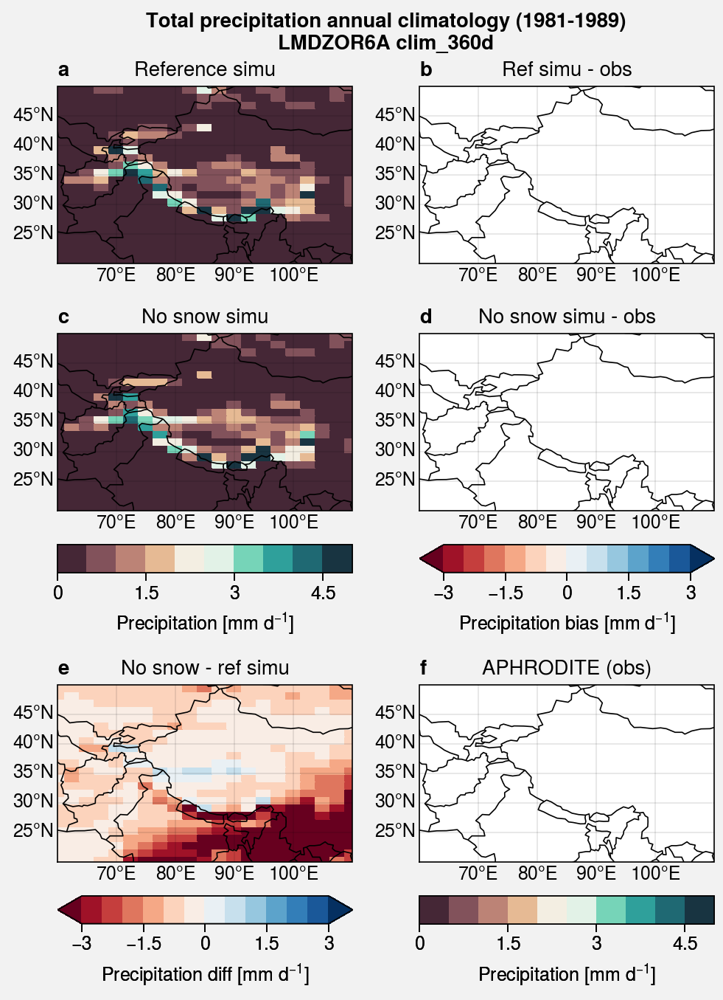

In [135]:
fig, axs = plot.subplots(ncols=2, nrows=3, proj='cyl', axwidth=2)

cmap = 'DryWet'
cmap_bias = 'RdBu'
levels = plot.arange(0, 5, 0.5)
levels_bias = plot.arange(-3, 3, 0.5)


# Ref
axs[0].pcolormesh(list_clim_ref[3], cmap=cmap, levels=levels)
axs[0].format(title='Reference simu')

# Ref - obs
axs[1].pcolormesh(list_clim_ref[3] - pr_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[1].format(title='Ref simu - obs')

# New
m1 = axs[2].pcolormesh(list_clim_new[3], cmap=cmap, levels=levels)
axs[2].format(title='No snow simu')

# New - obs
m4 = axs[3].pcolormesh(list_clim_new[3] - pr_obs_regrid_clim, cmap=cmap_bias, levels=levels_bias, extend='both')
axs[3].format(title='No snow simu - obs')

# New - ref
m2 = axs[4].pcolormesh(list_clim_new[3] - list_clim_ref[2], cmap=cmap_bias, levels=levels_bias, extend='both')
axs[4].format(title='No snow - ref simu')
axs[4].colorbar(m2, label='Precipitation diff [mm d$^{-1}$]', loc='b')


# Obs
axs[5].pcolormesh(pr_obs_regrid_clim, cmap=cmap, levels=levels)
axs[5].format(title='APHRODITE (obs)')
axs[5].colorbar(m1, label='Precipitation [mm d$^{-1}$]', loc='b')

axs[2].colorbar(m1, label='Precipitation [mm d$^{-1}$]', loc='b')
axs[3].colorbar(m4, label='Precipitation bias [mm d$^{-1}$]', loc='b')

axs.format(
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    labels=True, abc=True, borders=True, coast=True,
    suptitle='Total precipitation annual climatology (1981-1989)\nLMDZOR6A clim_360d'
)

# fig.save('img/LMDZOR6A_clim_360d_nosnow_tas_HMA.jpg')

/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


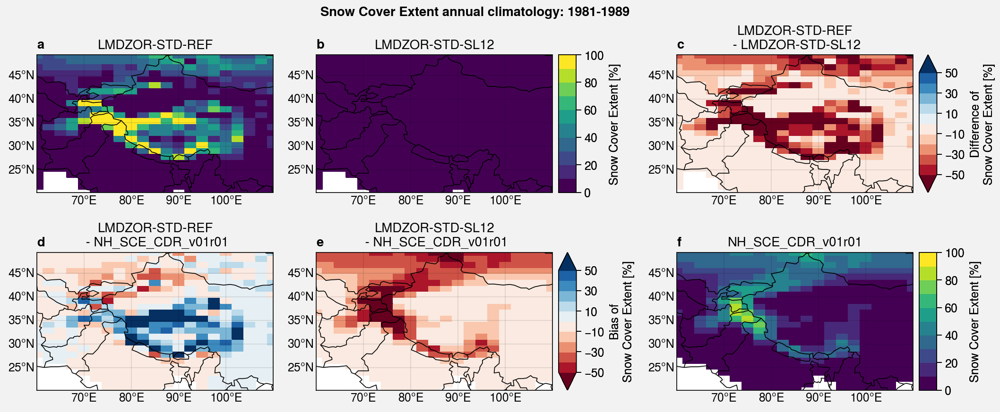

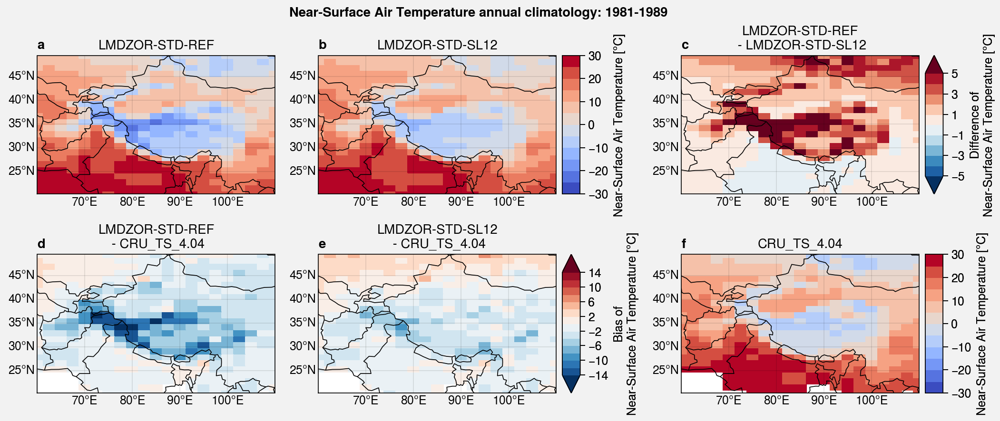

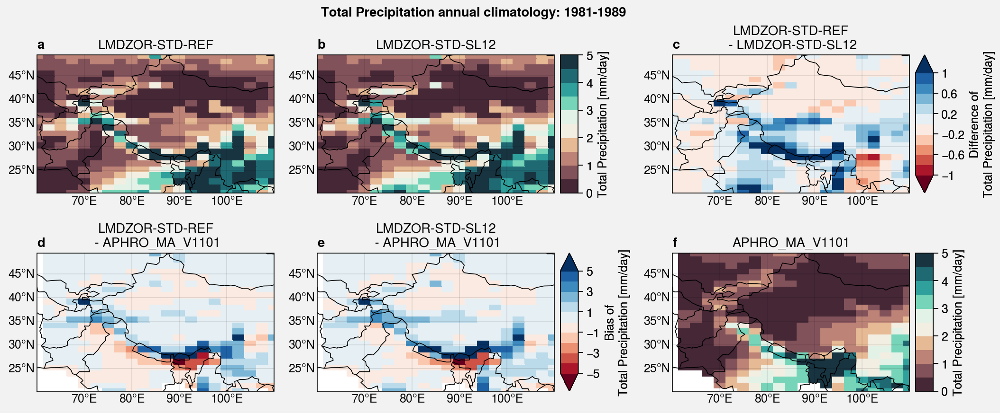

In [26]:
for i, var in enumerate(list_vars):
    label, units, \
    levels, cmap, extend, \
    levels_diff, cmap_diff, extend_diff, \
    levels_bias, cmap_bias, extend_bias = u.get_var_infos(var)

    u.plot_ref_new_obs(
        var, list_clim_ref[i], list_clim_new[i], list_clim_obs[i], label, units,
        levels, cmap, extend,
        levels_diff, cmap_diff, extend_diff,
        levels_bias, cmap_bias, extend_bias,
        save=True, dpi=300
    )

### Northern Hemisphere

#### Get data

In [27]:
# list_vars = ['frac_snow']
list_vars = ['frac_snow', 't2m']

# Period for climatologies (removing first year spin-up)
period = slice('1981','1989')
season = 'annual'
zone = 'NH'

list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
    list_vars, period, season, zone)


    #############
    ### Variable: frac_snow 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/SRF/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_frac_snow.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/SRF/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_frac_snow.nc

Get observation: NH_SCE_CDR
/data/mlalande/RUTGERS/nhsce_v01r01_19661004_20191202.nc



/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Reuse existing file: bilinear_88x88_72x144.nc

    #############
    ### Variable: t2m 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_t2m.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/ATM/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_t2m.nc

Get observation: CRU_TS
/data/mlalande/CRU/tmp/cru_ts4.04.1901.2019.tmp.dat.nc

Reuse existing file: bilinear_360x720_72x144_peri.nc


#### Make plots

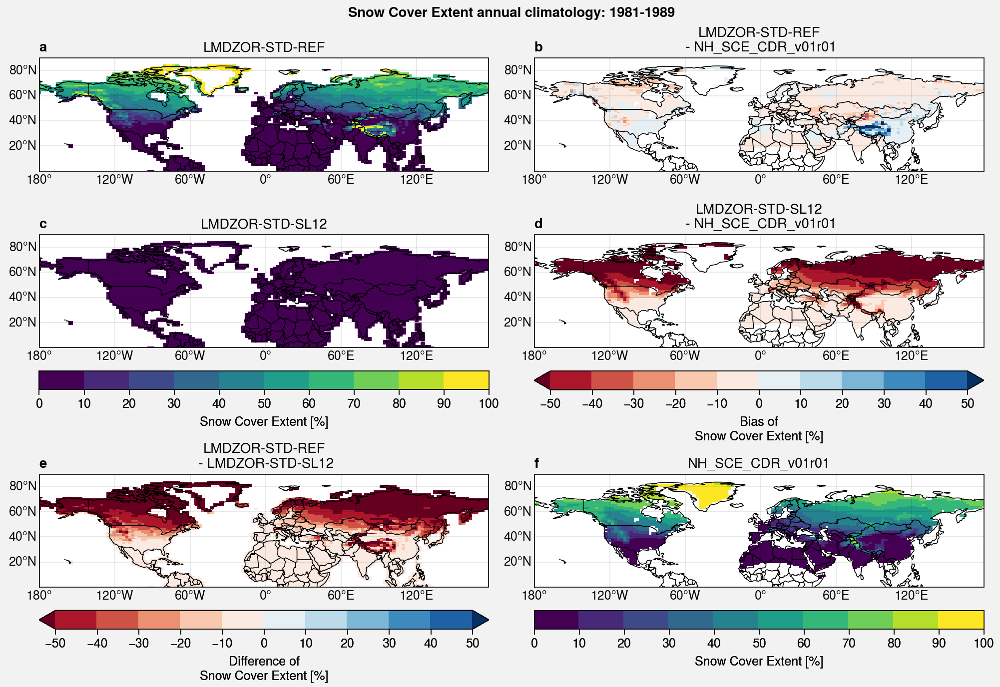

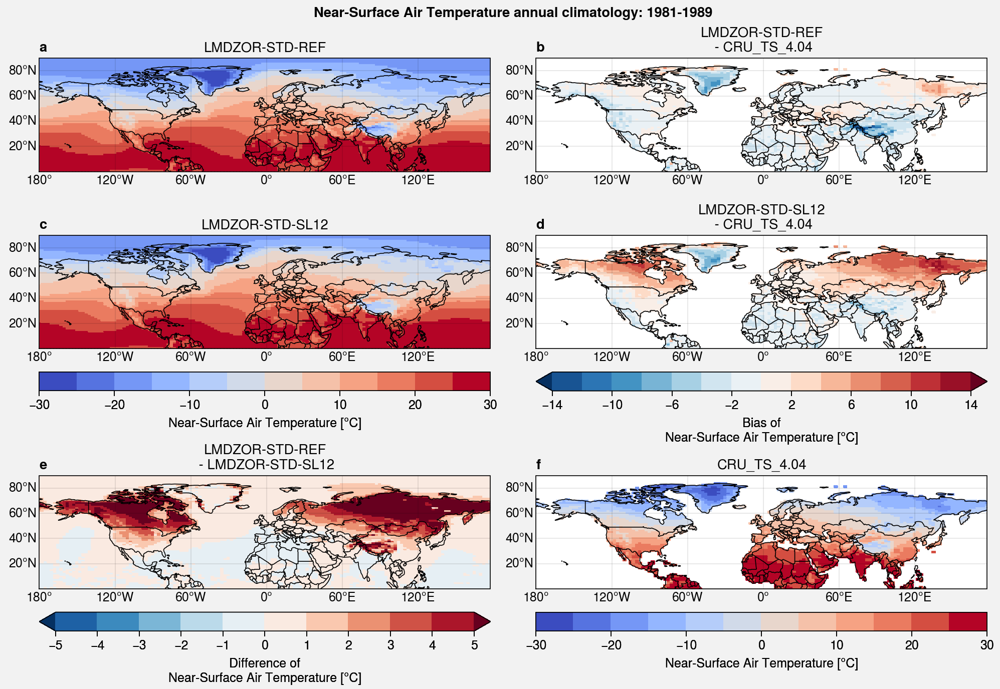

In [28]:
for i, var in enumerate(list_vars):
    label, units, \
    levels, cmap, extend, \
    levels_diff, cmap_diff, extend_diff, \
    levels_bias, cmap_bias, extend_bias = u.get_var_infos(var)

    u.plot_ref_new_obs(
        var, list_clim_ref[i], list_clim_new[i], list_clim_obs[i], label, units,
        levels, cmap, extend,
        levels_diff, cmap_diff, extend_diff,
        levels_bias, cmap_bias, extend_bias,
        save=True, dpi=300
    )

## Zonal plots

### Global

#### Get data

In [140]:
def get_data(list_vars, period, season, zone):
    """
        Get reference and new experiments + observations.

        Parameters
        ----------
        list_vars : list
            List of variables. Options are: 'frac_snow', 't2m', 'precip', 'ta'
        period : slice
            Period
        season : str
            Season (ex: 'annual', 'DJF', '1')
        zone : str
            Zone of study (ex: 'HMA', 'GLOB', 'NH')

        Returns
        -------
        ref, new, obs : list of Dataset
            List of reference and new experiments + observations regrided on model dataset (not 
            loaded) for each variable.
            
        clim_ref, clim_new, clim_obs : list of DataArray
            List of reference and new experiments + observations regrided on model climatologies
            for each variable.

        Example
        -------
        >>>  list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
                ['frac_snow', 't2m', 'precip'], slice('1981','1989'), 'annual', 'GLOB'
            )

    """
    
    list_ref = []
    list_new = []
    list_obs = []
    list_clim_ref = []
    list_clim_new = []
    list_clim_obs = []
       
    list_var_SRF = ['frac_snow']
    list_var_ATM = ['t2m', 'precip', 'ta']
    latlim, lonlim = u.get_zone(zone)

    for var in list_vars:

        print(
            f"""
    #############
    ### Variable: {var} 
    #############
            """
        )

        if var in list_var_SRF:
            component = 'SRF'
        elif var in list_var_ATM:
            component = 'ATM'
        else:
            raise ValueError(f"Invalid var argument: '{var}'. Valid names are: 'frac_snow'.")

        path = root+exp_ref+'/'+component+'/Analyse/TS_MO/'+exp_ref+'_19800101_19891230_1M_'+var+'.nc'
        print('Open reference simulation:\n'+path+'\n')
        ref = xr.open_dataset(path)[var]
        ref.attrs['title'] = exp_ref

        path = root+exp_new+'/'+component+'/Analyse/TS_MO/'+exp_new+'_19800101_19891230_1M_'+var+'.nc'
        print('Open new simulation:\n'+path+'\n')
        new = xr.open_dataset(path)[var]
        new.attrs['title'] = exp_new

        # Rename time dimension and sort latitude from -90 to 90
        ref = ref.rename({'time_counter': 'time'}).sortby('lat')
        new = new.rename({'time_counter': 'time'}).sortby('lat')

        # Compute climatolgy
        clim_ref = u.clim(
            ref.sel(time=period, lat=latlim, lon=lonlim), season=season, calendar='360_day')
        clim_ref.attrs['season'] = season
        clim_ref.attrs['zone'] = zone

        clim_new = u.clim(
            new.sel(time=period, lat=latlim, lon=lonlim), season=season, calendar='360_day')
        clim_new.attrs['season'] = season
        clim_new.attrs['zone'] = zone

        # Unit conversion
        if var in ['tas', 'tmp', 't2m', 'ta']:
            with xr.set_options(keep_attrs=True):
                clim_ref -= 273.15
                clim_new -= 273.15
            clim_ref.attrs['units'] = '°C'
            clim_new.attrs['units'] = '°C'

            if var in ['ta']:
                clim_ref = clim_ref.assign_coords({'plev': clim_ref.plev/100}).rename({'plev': 'level'})
                clim_new = clim_new .assign_coords({'plev': clim_new.plev/100}).rename({'plev': 'level'})

        elif var in ['pr', 'precip']:
            with xr.set_options(keep_attrs=True):
                clim_ref *= 86400
                clim_new *= 86400
            clim_ref.attrs['units'] = 'mm/day'
            clim_new.attrs['units'] = 'mm/day'

        # Get observations
        if var in ['snc', 'frac_snow']:
            obs_name = 'NH_SCE_CDR'
            version = 'v01r01'
        elif var in ['tas', 'tmp', 't2m']:
            obs_name = 'CRU_TS'
            version = '4.04'
        elif var in ['pr', 'precip']:
            obs_name = 'APHRO_MA'
            version = 'V1101'
        elif var in ['ta']:
            obs_name = 'ERAI'
            version = ''

        obs = u.get_obs(obs_name, version, var, period=period, machine='CICLAD', regrid=clim_ref)
        clim_obs = u.clim(
            obs.sel(time=period, lat=latlim, lon=lonlim), season=season, calendar='standard')
        
        list_ref.append(ref)
        list_new.append(new)
        list_obs.append(obs)
        list_clim_ref.append(clim_ref)
        list_clim_new.append(clim_new)
        list_clim_obs.append(clim_obs)
               
    return list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs

In [ ]:
# delete file bilinear_241x480_143x144_peri.nc

In [163]:
list_vars = ['ta']

# Period for climatologies (removing first year spin-up)
period = slice('1981','1989')
season = 'annual'
zone = 'GLOB'

list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
    list_vars, period, season, zone)


    #############
    ### Variable: ta 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_ta.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/ATM/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_ta.nc

Get observation: ERAI
/bdd/ERAI/NETCDF/GLOBAL_075/1xmonthly/AN_PL/*/ta.*.apmei.GLOBAL_075.nc

Create weight file: bilinear_241x480_143x144_peri.nc


#### Make plots

In [164]:
for i in range(len(list_vars)):
    list_clim_ref[i].load()
    list_clim_new[i].load()
    list_clim_obs[i].load()

In [173]:
def plot_zonal_bias_HMA(
    var, ref, new, obs, label, units,
    levels_diff, cmap_diff, extend_diff,
    levels_bias, cmap_bias, extend_bias,
    save=False, dpi=300
):
    
    fig, axs = plot.subplots(nrows=3, ncols=3, axwidth=2)

    k = 0 # Index for axes
    color = 'black' # Line color for climatology contour
    lw = 0.6 # Line width for climatology contour
    alpha = 0.8 # Transparence for climatology contour
    ylim = (1000,0)
    
    latlim, lonlim = u.get_zone('HMA')
    
    ################################################
    # Bias between simulations versus observations #
    ################################################
    
    for simu in [ref, new]:
        bias = simu - obs
        
        # Global
        m = axs[k].contourf(
            bias.mean('lon', skipna=False),
            cmap=cmap_bias,
            levels=levels_bias,
            extend=extend_bias
        )
        axs[k].contour(
            simu.mean('lon', skipna=False),
            color=color,
            lw=lw,
            alpha=alpha,
            labels=True
        )
        axs[k].format(
            ylim=ylim,
            title=''
        )
        k += 1
        
        # HMA
        axs[k].contourf(
            bias.sel(lon=lonlim).mean('lon', skipna=False),
            cmap=cmap_bias,
            levels=levels_bias,
            extend=extend_bias
        )
        axs[k].contour(
            simu.sel(lon=lonlim).mean('lon', skipna=False),
            color=color,
            lw=lw,
            alpha=alpha,
            labels=True
        )
        axs[k].format(
            ylim=ylim,
        )
        k += 1

        # Global without HMA
        axs[k].contourf(
            bias.where(
                (bias.lon < lonlim.start) | (bias.lon > lonlim.stop),
                drop=True
            ).mean('lon', skipna=False),
            cmap=cmap_bias,
            levels=levels_bias,
            extend=extend_bias
        )
        axs[k].contour(
            simu.where(
                (bias.lon < lonlim.start) | (bias.lon > lonlim.stop),
                drop=True
            ).mean('lon', skipna=False),
            color=color,
            labels=True,
            lw=lw,
            alpha=alpha
        )
        axs[k].format(
            ylim=ylim,
            title=''
        )
        k += 1

    fig.colorbar(
        m, 
        label='Bias of ' + label + ' [' + units + ']',
        loc='r',
        rows=(1, 2)
    )
    
    ###########################################
    # Differences between the two simulations #
    ###########################################
    
    diff = new - ref
    
    # Global
    m = axs[k].contourf(
        diff.mean('lon', skipna=False),
        cmap=cmap_diff,
        levels=levels_diff,
        extend=extend_diff
    )
    axs[k].contour(
        new.mean('lon', skipna=False),
        color=color,
        lw=lw,
        alpha=alpha,
        labels=True
    )
    axs[k].format(
        ylim=ylim,
        title=''
    )
    k += 1

    # HMA
    axs[k].contourf(
        diff.sel(lon=lonlim).mean('lon', skipna=False),
        cmap=cmap_diff,
        levels=levels_diff,
        extend=extend_diff
    )
    axs[k].contour(
        new.sel(lon=lonlim).mean('lon', skipna=False),
        color=color,
        lw=lw,
        alpha=alpha,
        labels=True
    )
    axs[k].format(
        ylim=ylim,
    )
    k += 1

    # Global without HMA
    axs[k].contourf(
        diff.where(
            (diff.lon < lonlim.start) | (diff.lon > lonlim.stop),
            drop=True
        ).mean('lon', skipna=False),
        cmap=cmap_diff,
        levels=levels_diff,
        extend=extend_diff
    )
    axs[k].contour(
        new.where(
            (bias.lon < lonlim.start) | (bias.lon > lonlim.stop),
            drop=True
        ).mean('lon', skipna=False),
        color=color,
        labels=True,
        lw=lw,
        alpha=alpha
    )
    axs[k].format(
        ylim=ylim,
        title=''
    )
    k += 1
    
    fig.colorbar(
        m, 
        label='Difference of ' + label + ' [' + units + ']',
        loc='r',
        row=3
    )
    
    ##########
    # Format #
    ##########
    
    axs.format(
        suptitle=label + " " + ref.attrs['season'] + " zonal climatology bias (" + \
            new.attrs['period']+')\nLMDZOR6A clim_360d', 
        abc=True, abcloc='ul',
        collabels=[
            'Global', 
            'HMA ('+str(lonlim.start)+'°E-'+str(lonlim.stop)+'°E)',
            'Global without HMA',
            
        ],
        rowlabels=['Ref  \n-    \nERAI', 'No snow\n-      \nERAI   ', 'No snow\n-      \nRef    '],
        ylabel='Level (hPa)'
    )

    if save:
        fig.save('img/LMDZOR6A_clim_360d_nosnow_ta_HMA.jpg')        

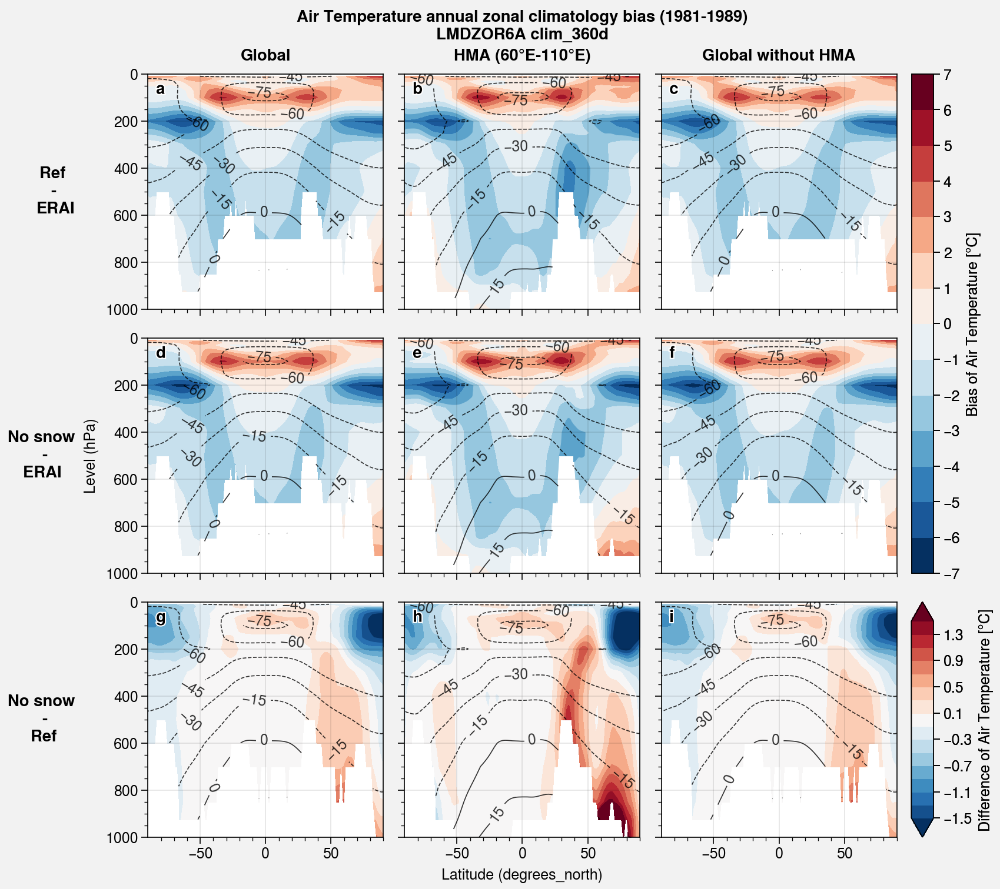

In [175]:
for i, var in enumerate(list_vars):
    label, units, \
    levels, cmap, extend, \
    levels_diff, cmap_diff, extend_diff, \
    levels_bias, cmap_bias, extend_bias = u.get_var_infos(var)
    
    levels_diff = plot.arange(-1.5, 1.5, 0.2)
    
    plot_zonal_bias_HMA(
        var, list_clim_ref[i], list_clim_new[i], list_clim_obs[i], label, units,
        levels_diff, cmap_diff, extend_diff,
        levels_bias, cmap_bias, extend_bias,
        save=True, dpi=300
    )

# Sais

#### Get data

In [176]:
# list_vars = ['frac_snow']
list_vars = ['frac_snow', 't2m']

# Period for climatologies (removing first year spin-up)
period = slice('1981','1989')
season = 'DJF'
zone = 'NH'

list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
    list_vars, period, season, zone)


    #############
    ### Variable: frac_snow 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/SRF/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_frac_snow.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/SRF/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_frac_snow.nc

Get observation: NH_SCE_CDR
/data/mlalande/RUTGERS/nhsce_v01r01_19661004_20191202.nc



/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Create weight file: bilinear_88x88_72x144.nc


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)



    #############
    ### Variable: t2m 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_t2m.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/ATM/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_t2m.nc

Get observation: CRU_TS
/data/mlalande/CRU/tmp/cru_ts4.04.1901.2019.tmp.dat.nc

Create weight file: bilinear_360x720_72x144_peri.nc


#### Make plots

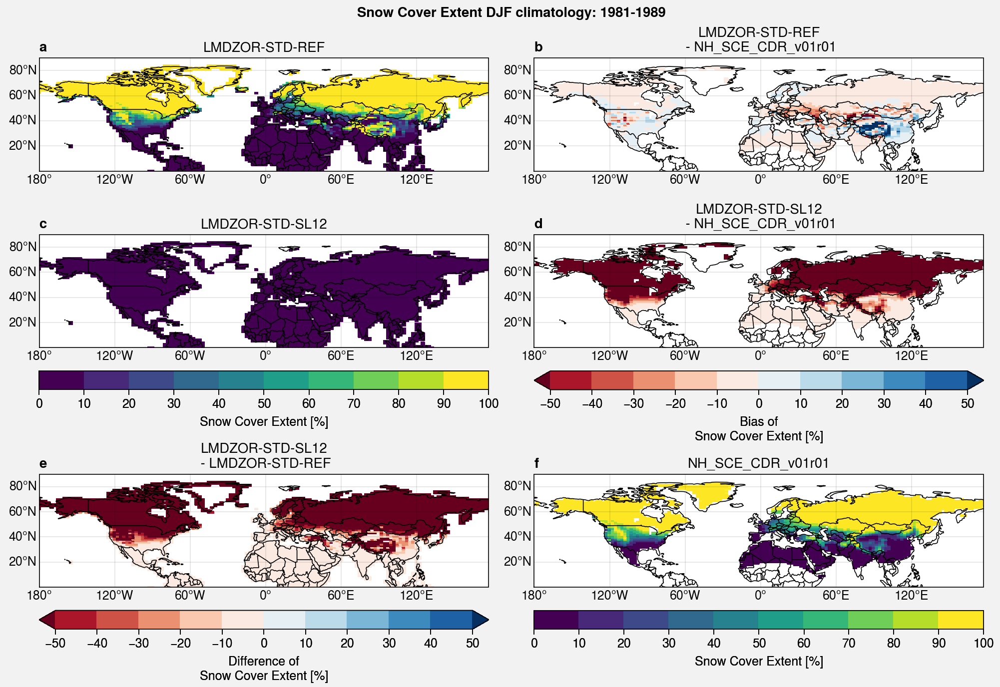

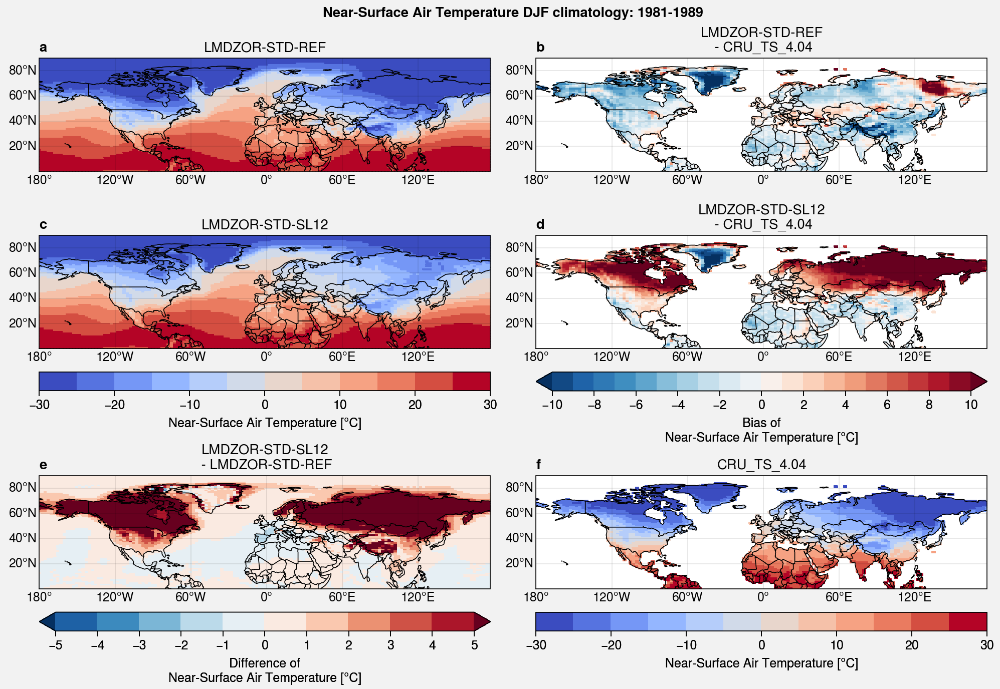

In [177]:
for i, var in enumerate(list_vars):
    label, units, \
    levels, cmap, extend, \
    levels_diff, cmap_diff, extend_diff, \
    levels_bias, cmap_bias, extend_bias = u.get_var_infos(var)

    u.plot_ref_new_obs(
        var, list_clim_ref[i], list_clim_new[i], list_clim_obs[i], label, units,
        levels, cmap, extend,
        levels_diff, cmap_diff, extend_diff,
        levels_bias, cmap_bias, extend_bias,
        save=False, dpi=300
    )

In [178]:
# list_vars = ['frac_snow']
list_vars = ['frac_snow', 't2m']

# Period for climatologies (removing first year spin-up)
period = slice('1981','1989')
season = 'JJA'
zone = 'NH'

list_ref, list_new, list_obs, list_clim_ref, list_clim_new, list_clim_obs = get_data(
    list_vars, period, season, zone)


    #############
    ### Variable: frac_snow 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/SRF/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_frac_snow.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/SRF/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_frac_snow.nc

Get observation: NH_SCE_CDR
/data/mlalande/RUTGERS/nhsce_v01r01_19661004_20191202.nc



/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Reuse existing file: bilinear_88x88_72x144.nc

    #############
    ### Variable: t2m 
    #############
            
Open reference simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-REF/ATM/Analyse/TS_MO/LMDZOR-STD-REF_19800101_19891230_1M_t2m.nc

Open new simulation:
/thredds/idris/work/ufz23bm/IGCM_OUT/LMDZOR/PROD/clim/LMDZOR-STD-SL12/ATM/Analyse/TS_MO/LMDZOR-STD-SL12_19800101_19891230_1M_t2m.nc

Get observation: CRU_TS
/data/mlalande/CRU/tmp/cru_ts4.04.1901.2019.tmp.dat.nc

Reuse existing file: bilinear_360x720_72x144_peri.nc


#### Make plots

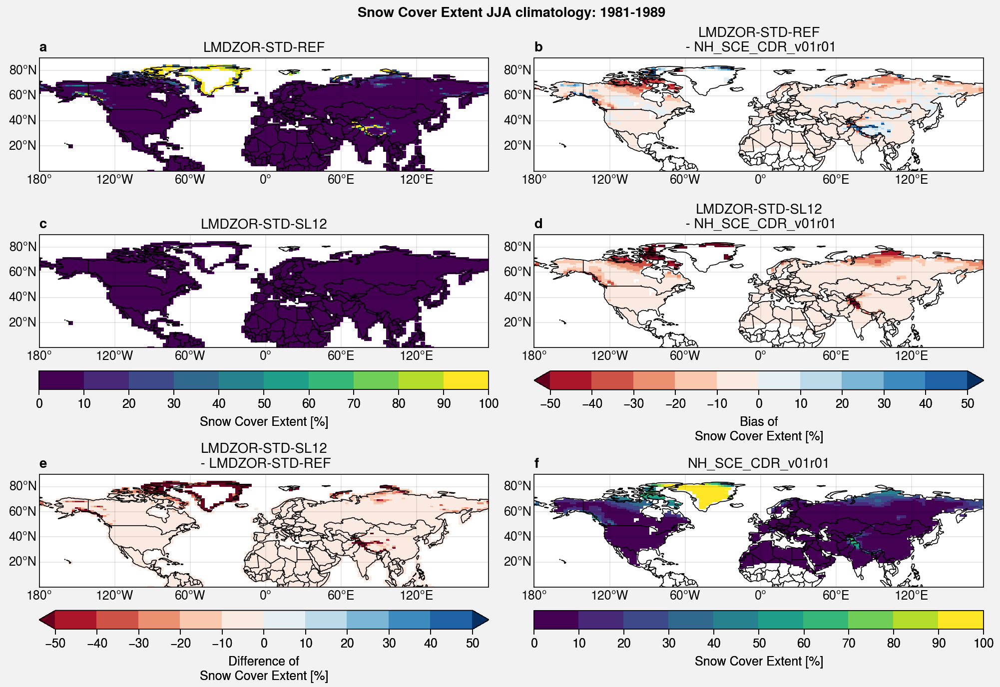

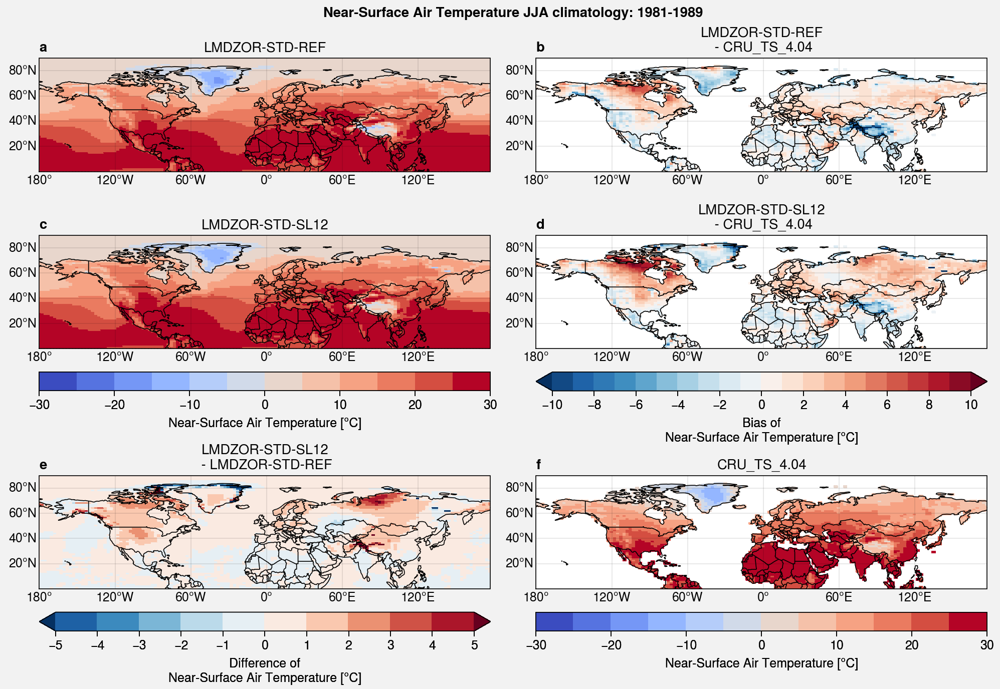

In [179]:
for i, var in enumerate(list_vars):
    label, units, \
    levels, cmap, extend, \
    levels_diff, cmap_diff, extend_diff, \
    levels_bias, cmap_bias, extend_bias = u.get_var_infos(var)

    u.plot_ref_new_obs(
        var, list_clim_ref[i], list_clim_new[i], list_clim_obs[i], label, units,
        levels, cmap, extend,
        levels_diff, cmap_diff, extend_diff,
        levels_bias, cmap_bias, extend_bias,
        save=False, dpi=300
    )